In [29]:
!pip install wget

Looking in indexes: https://mirrors.aliyun.com/pypi/simple
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9680 sha256=ca322b5e5fd37537cd917e5d16d5d3aa187e8148d9fe8215da033840adf2e6b9
  Stored in directory: c:\users\sirisha\appdata\local\pip\cache\wheels\a3\7f\7d\7afeb7527735f083c7680011eb17b68da66ef653d8fce6f362
Successfully built wget


In [30]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-Coursera/images%20/images_part_5/DLguys.jpeg
!wget https://www.ajot.com/images/uploads/article/quantas-car-v-plane-TAKE-OFF.jpg
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-Coursera/images%20/images_part_5/istockphoto-187786732-612x612.jpeg
!wget https://cdn.webrazzi.com/uploads/2015/03/andrew-ng1.jpg

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


In [3]:
import torchvision 
from torchvision import transforms
import torch 
from torch import no_grad

In [2]:
!conda install pytorch=1.1.0 torchvision -c pytorch -y

Retrieving notices: ...working... done
Solving environment: ...working... unsuccessful initial attempt using frozen solve. Retrying with flexible solve.
Solving environment: ...working... unsuccessful initial attempt using frozen solve. Retrying with flexible solve.


DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): mirrors.tuna.tsinghua.edu.cn:443
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): mirrors.tuna.tsinghua.edu.cn:443
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): mirrors.tuna.tsinghua.edu.cn:443
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): mirrors.tuna.tsinghua.edu.cn:443
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): mirrors.tuna.tsinghua.edu.cn:443
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): mirrors.tuna.tsinghua.edu.cn:443
DEBUG:urllib3.connectionpool:https://mirrors.tuna.tsinghua.edu.cn:443 "GET /anaconda/pkgs/msys2/notices.json HTTP/1.1" 404 None
DEBUG:urllib3.connectionpool:https://mirrors.tuna.tsinghua.edu.cn:443 "GET /anaconda/pkgs/main/notices.json HTTP/1.1" 404 None
DEBUG:urllib3.connectionpool:https://mirrors.tuna.tsinghua.edu.cn:443 "GET /anaconda/cloud/pytorch/notices.json HTTP/1.1" 404 None
DEBUG:urllib3.connectionpool:htt

In [4]:
import requests

In [11]:
!pip install opencv-python


Looking in indexes: https://mirrors.aliyun.com/pypi/simple
     ---------------------------------------- 0.0/38.1 MB ? eta -:--:--
     ---------------------------------------- 0.1/38.1 MB 3.3 MB/s eta 0:00:12
     ---------------------------------------- 0.1/38.1 MB 3.3 MB/s eta 0:00:12
     ---------------------------------------- 0.2/38.1 MB 2.1 MB/s eta 0:00:19
     ---------------------------------------- 0.2/38.1 MB 2.1 MB/s eta 0:00:19
      --------------------------------------- 0.5/38.1 MB 2.2 MB/s eta 0:00:17
      --------------------------------------- 0.5/38.1 MB 2.2 MB/s eta 0:00:17
      --------------------------------------- 0.7/38.1 MB 2.2 MB/s eta 0:00:18
      --------------------------------------- 0.8/38.1 MB 2.4 MB/s eta 0:00:16
     - -------------------------------------- 1.0/38.1 MB 2.3 MB/s eta 0:00:16
     - -------------------------------------- 1.1/38.1 MB 2.4 MB/s eta 0:00:16
     - -------------------------------------- 1.3/38.1 MB 2.4 MB/s eta 0:00:16


In [5]:
import cv2 
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [6]:
def get_predictions(pred, threshold=0.8, objects=None):
    """
    This function will assign a string name to a predicted class and eliminate predictions whose likelihood  is under a threshold 
    
    pred: a list where each element contains a tuple that corresponds to information about  the different objects; Each element includes a tuple with the class yhat, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    image : frozen surface
    predicted_classes: a list where each element contains a tuple that corresponds to information about  the different objects; Each element includes a tuple with the class name, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    thre
    """


    predicted_classes= [(COCO_INSTANCE_CATEGORY_NAMES[i],p,[(box[0], box[1]), (box[2], box[3])]) for i,p,box in zip(list(pred[0]['labels'].numpy()),pred[0]['scores'].detach().numpy(),list(pred[0]['boxes'].detach().numpy()))]
    predicted_classes=[  stuff  for stuff in predicted_classes  if stuff[1]>threshold ]
    
    if objects  and predicted_classes :
        predicted_classes=[ (name, p, box) for name, p, box in predicted_classes if name in  objects ]
    return predicted_classes

In [7]:
def draw_box(pred_class, img, rect_th=2, text_size=0.5, text_th=2, download_image=False, img_name="img"):
    """
    draws box around each object 
    
    predicted_classes: a list where each element contains a tuple that corresponds to information about the different objects; Each element includes a tuple with the class name, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    image : frozen surface 
   
    """
    image = (np.clip(cv2.cvtColor(np.clip(img.numpy().transpose((1, 2, 0)), 0, 1), cv2.COLOR_RGB2BGR), 0, 1) * 255).astype(np.uint8).copy()

    for predicted_class in pred_class:
      
      label=predicted_class[0]
      probability=predicted_class[1]
      box=predicted_class[2]
      t = round(box[0][0].tolist())
      l = round(box[0][1].tolist())
      r = round(box[1][0].tolist())
      b = round(box[1][1].tolist())

      # Giving brief information about rectange, class and probability.
      from colorama import Fore
      from colorama import Style
      print(f"\nLabel: {Fore.GREEN}{label}{Style.RESET_ALL}")
      print(f"Box coordinates: {t}, {l}, {r}, {b}")
      print(f"Probability: {probability}")

      # Drawing rectangle and adding text on the picture based on their class and size.
      cv2.rectangle(image, (t, l), (r, b), (0, 255, 0), rect_th)
      cv2.rectangle(image, (t, l), (t+110, l+17), (255, 255, 255), -1)
      cv2.putText(image, label, (t+10, l+12),  cv2.FONT_HERSHEY_SIMPLEX, 
                  text_size, (0,255,0), thickness=text_th)
      cv2.putText(image, label+": "+str(round(probability, 2)), 
                  (t+10, l+12),  cv2.FONT_HERSHEY_SIMPLEX, text_size, 
                  (0, 255, 0),thickness=text_th)

    # Plotting image
    image = np.array(image)
    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    if download_image:
      plt.savefig(f'{img_name}.png')
    else:
      pass
    plt.show()
    
    del(img)
    del(image)

In [8]:
def save_RAM(image_=False):
    global image, img, pred
    torch.cuda.empty_cache()
    del(img)
    del(pred)
    if image_:
        image.close()
        del(image)

# Load Pre-trained Faster R-CNN

In [9]:
model_ = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model_.eval()

for name, param in model_.named_parameters():
    param.requires_grad = False 
print("done")

C:\Users\SIRISHA\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\SIRISHA\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


done


In [10]:
model_ = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights='FasterRCNN_ResNet50_FPN_Weights.DEFAULT') 
model_.eval()

for name, param in model_.named_parameters():
    param.requires_grad = False
print("done")

done


In [11]:
def model(x):
    with torch.no_grad():
        yhat = model_(x) 
        return yhat

In [12]:
COCO_INSTANCE_CATEGORY_NAMES = [ 'background', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush' ] 
len(COCO_INSTANCE_CATEGORY_NAMES)

91

# Object Localization

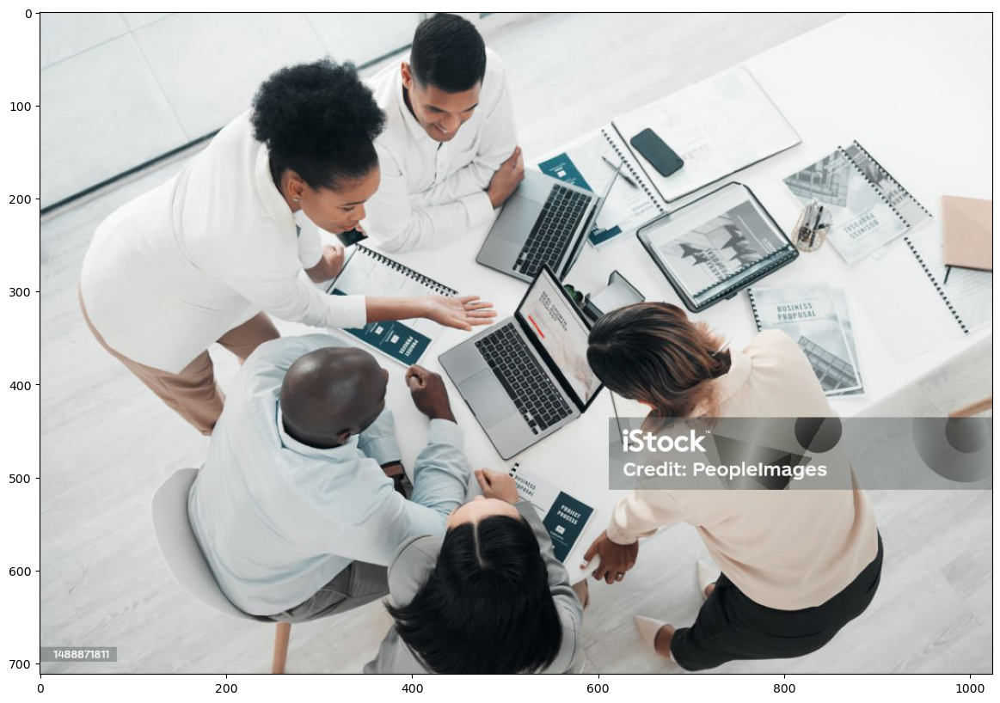

In [13]:
img_path='obj1.jpg'
half = 0.5
image = Image.open(img_path)

image.resize([int(half * s) for s in image.size] )
plt.figure(figsize=(15, 10))
plt.imshow(image)
plt.show()

In [14]:
transform = transforms.Compose([transforms.ToTensor()])

In [15]:
img = transform(image)

In [16]:
img

tensor([[[0.8588, 0.8588, 0.8588,  ..., 0.9373, 0.9333, 0.9333],
         [0.8588, 0.8588, 0.8588,  ..., 0.9373, 0.9333, 0.9333],
         [0.8588, 0.8588, 0.8588,  ..., 0.9373, 0.9373, 0.9333],
         ...,
         [0.7137, 0.7098, 0.7020,  ..., 0.7176, 0.7176, 0.7216],
         [0.7176, 0.7098, 0.6980,  ..., 0.7176, 0.7176, 0.7137],
         [0.7176, 0.7098, 0.6941,  ..., 0.7137, 0.7098, 0.7098]],

        [[0.8784, 0.8784, 0.8784,  ..., 0.9451, 0.9412, 0.9412],
         [0.8784, 0.8784, 0.8784,  ..., 0.9451, 0.9412, 0.9412],
         [0.8784, 0.8784, 0.8784,  ..., 0.9451, 0.9451, 0.9412],
         ...,
         [0.7294, 0.7255, 0.7176,  ..., 0.7255, 0.7255, 0.7294],
         [0.7333, 0.7255, 0.7137,  ..., 0.7255, 0.7255, 0.7216],
         [0.7333, 0.7255, 0.7098,  ..., 0.7216, 0.7176, 0.7176]],

        [[0.8902, 0.8902, 0.8902,  ..., 0.9412, 0.9373, 0.9373],
         [0.8902, 0.8902, 0.8902,  ..., 0.9412, 0.9373, 0.9373],
         [0.8902, 0.8902, 0.8902,  ..., 0.9412, 0.9412, 0.

In [17]:
pred = model([img])

In [18]:
len(pred[0]['labels'])

53

In [19]:
pred[0]['labels']

tensor([ 1,  1, 73,  1,  1,  1, 77,  1, 84, 62, 76, 73, 32, 76, 84, 84,  1,  1,
         1,  1, 84, 84,  1, 75, 84, 77, 42, 84,  1,  1, 73,  1,  1,  1,  1,  1,
        77,  1, 32,  1, 75, 32, 75, 73, 84, 73, 84, 32,  1,  1,  1,  1, 84])

In [20]:
pred[0]['scores']

tensor([0.9823, 0.9672, 0.9587, 0.9516, 0.9498, 0.9426, 0.8997, 0.8481, 0.8419,
        0.8071, 0.7781, 0.7512, 0.7274, 0.7077, 0.6211, 0.6120, 0.6077, 0.5702,
        0.5154, 0.4958, 0.4905, 0.4156, 0.3642, 0.2830, 0.2425, 0.2329, 0.2263,
        0.2160, 0.1852, 0.1769, 0.1581, 0.1546, 0.1528, 0.1454, 0.1159, 0.1072,
        0.0901, 0.0838, 0.0812, 0.0778, 0.0771, 0.0766, 0.0753, 0.0722, 0.0719,
        0.0713, 0.0707, 0.0618, 0.0617, 0.0583, 0.0559, 0.0555, 0.0503])

In [21]:
index=pred[0]['labels'][0].item()
COCO_INSTANCE_CATEGORY_NAMES[index]

'person'

In [22]:
bounding_box=pred[0]['boxes'][0].tolist()
bounding_box

[35.31065368652344, 39.7285270690918, 475.07843017578125, 590.2144165039062]

In [23]:
t, l, r, b = [round(x) for x in bounding_box]
print(t, l, r, b)

35 40 475 590


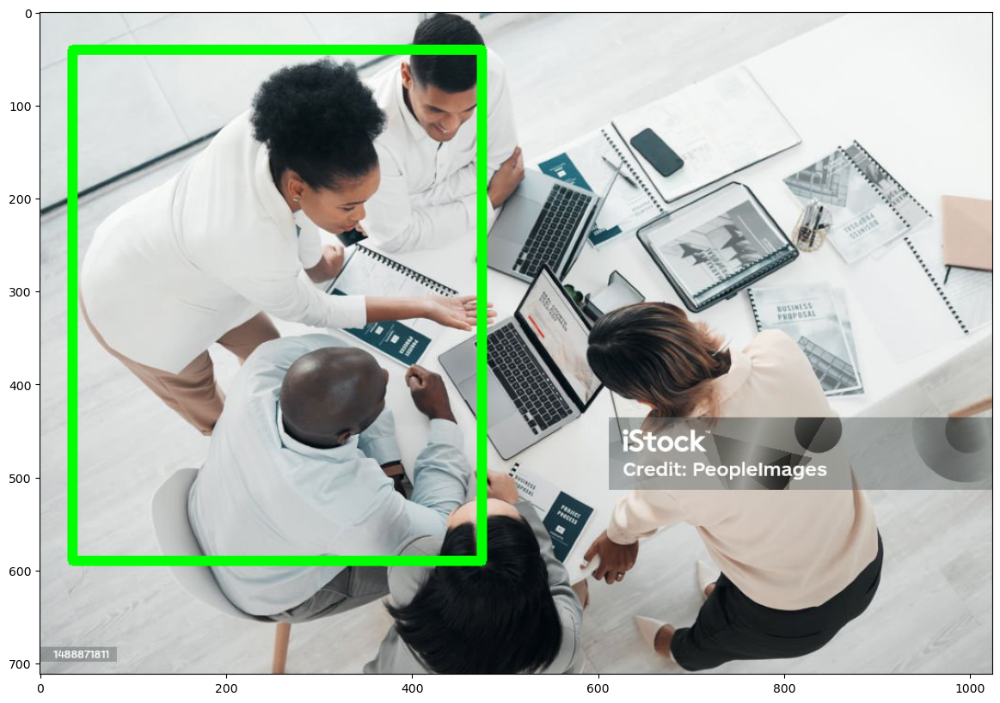

In [24]:
img_plot=(np.clip(cv2.cvtColor(np.clip(img.numpy().transpose((1, 2, 0)), 0, 1), cv2.COLOR_RGB2BGR), 0, 1) * 255).astype(np.uint8)
cv2.rectangle(img_plot, (t, l), (r, b), (0, 255, 0), 10) # Draw Rectangle with the coordinates
plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img_plot, cv2.COLOR_BGR2RGB))
plt.show()
del img_plot, t, l, r, b


Label: person
Box coordinates: 35, 40, 475, 590
Probability: 0.9822706580162048

Label: person
Box coordinates: 579, 313, 909, 696
Probability: 0.967176616191864

Label: person
Box coordinates: 340, 7, 517, 269
Probability: 0.9516043066978455

Label: person
Box coordinates: 151, 339, 454, 671
Probability: 0.9498079419136047

Label: person
Box coordinates: 369, 510, 588, 712
Probability: 0.9425997734069824

Label: person
Box coordinates: 594, 498, 917, 692
Probability: 0.8480767607688904


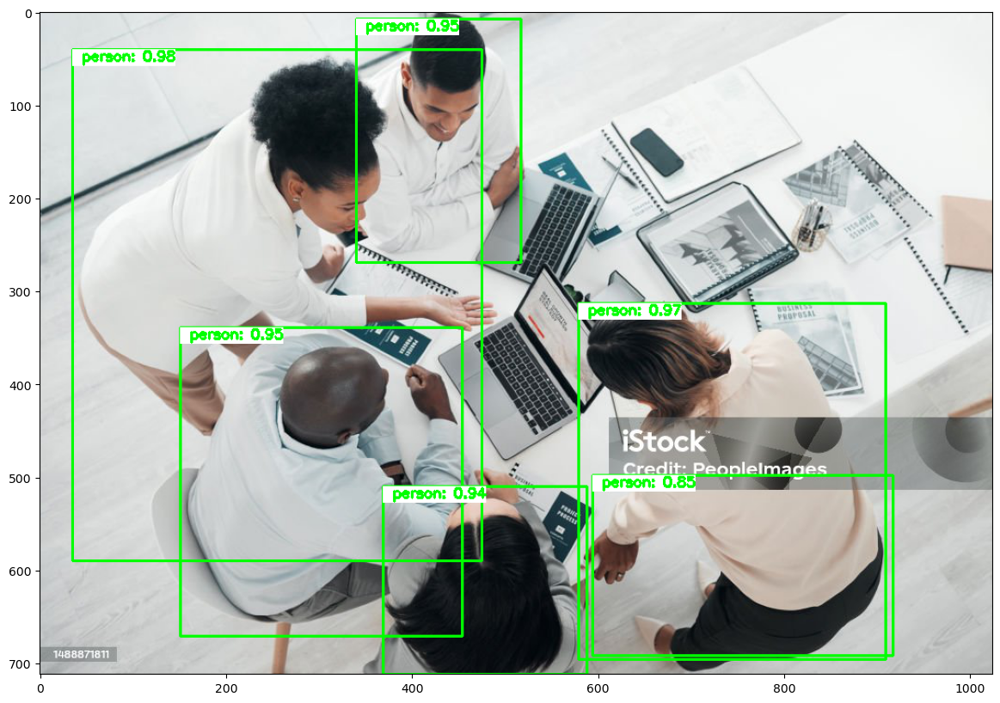

In [25]:
pred_class=get_predictions(pred, objects="person")
draw_box(pred_class, img)

del pred_class

In [26]:
get_predictions(pred, threshold=1, objects="person")

[]


Label: person
Box coordinates: 35, 40, 475, 590
Probability: 0.9822706580162048


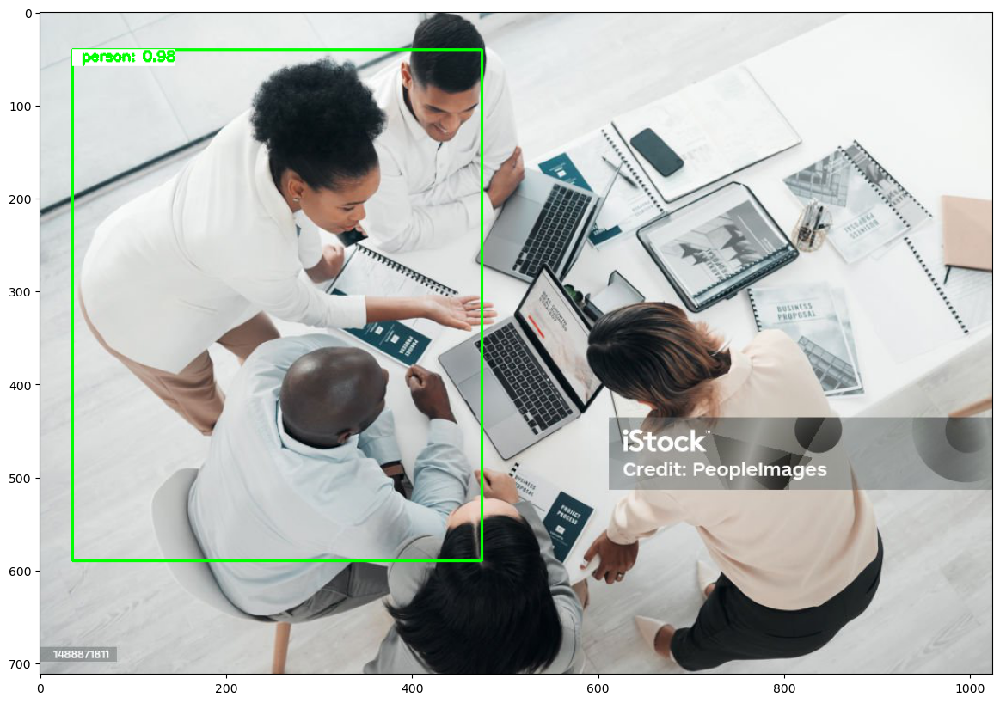

In [27]:
pred_thresh=get_predictions(pred, threshold=0.98, objects="person")
draw_box(pred_thresh, img, download_image=True, img_name="andrew_BOX")
del pred_thresh

In [28]:
save_RAM(image_=True)

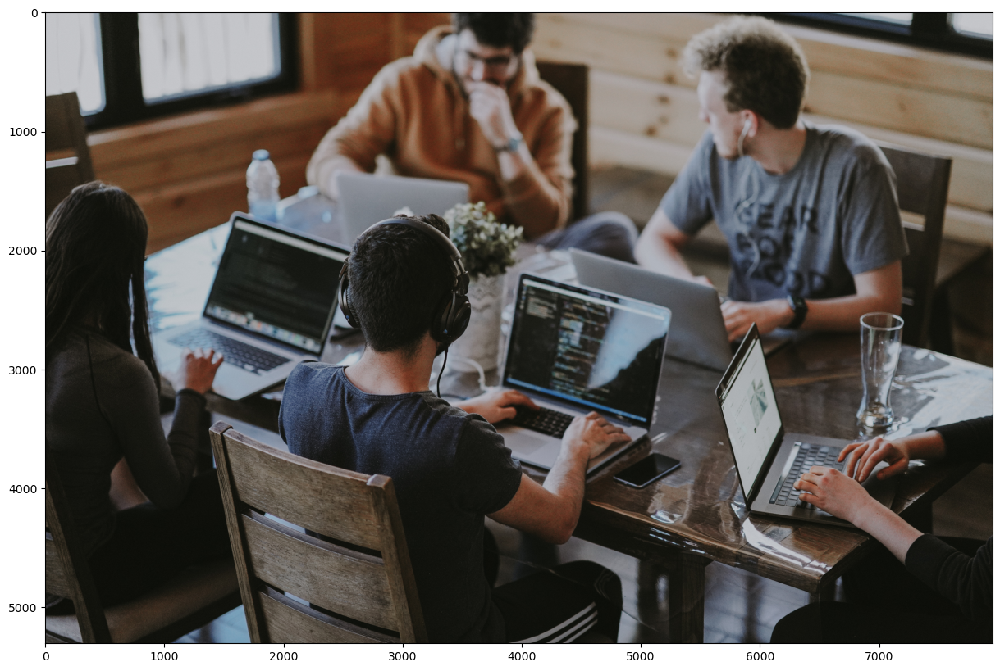

In [29]:
img_path='obj2.jpg'
image = Image.open(img_path)
image.resize([int(half * s) for s in image.size])
plt.figure(figsize=(15, 10))
plt.imshow(np.array(image))
plt.show()


Label: person
Box coordinates: 4842, 102, 7253, 2858
Probability: 0.9979773163795471

Label: laptop
Box coordinates: 5658, 2637, 7180, 4457
Probability: 0.9976850748062134

Label: cell phone
Box coordinates: 4748, 3697, 5346, 4018
Probability: 0.9971367120742798

Label: laptop
Box coordinates: 925, 1740, 2509, 3244
Probability: 0.9962024092674255

Label: laptop
Box coordinates: 3742, 2105, 5339, 3943
Probability: 0.9946879148483276

Label: person
Box coordinates: 1839, 1696, 4999, 5228
Probability: 0.985762357711792

Label: person
Box coordinates: 2138, 10, 4437, 1799
Probability: 0.970599353313446

Label: chair
Box coordinates: 1393, 3491, 3341, 5304
Probability: 0.9618781805038452

Label: person
Box coordinates: 7, 1615, 1508, 4802
Probability: 0.9549222588539124

Label: person
Box coordinates: 6244, 3360, 7952, 5249
Probability: 0.9545698165893555

Label: chair
Box coordinates: 7058, 1115, 7605, 2851
Probability: 0.9495779871940613

Label: bottle
Box coordinates: 1689, 1159, 1978, 

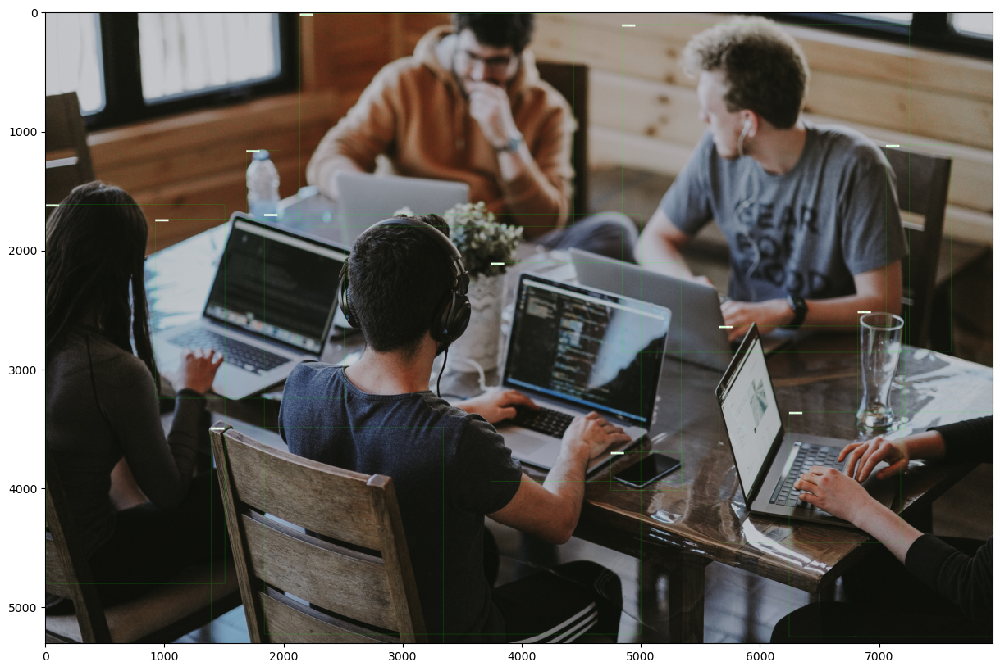

In [30]:
img = transform(image)
pred = model([img])
pred_thresh=get_predictions(pred, threshold=0.8)
draw_box(pred_thresh, img, rect_th=1, text_size= 0.5, text_th=1)

del pred_thresh


Label: person
Box coordinates: 4842, 102, 7253, 2858
Probability: 0.9979773163795471

Label: laptop
Box coordinates: 5658, 2637, 7180, 4457
Probability: 0.9976850748062134

Label: cell phone
Box coordinates: 4748, 3697, 5346, 4018
Probability: 0.9971367120742798

Label: laptop
Box coordinates: 925, 1740, 2509, 3244
Probability: 0.9962024092674255

Label: laptop
Box coordinates: 3742, 2105, 5339, 3943
Probability: 0.9946879148483276

Label: person
Box coordinates: 1839, 1696, 4999, 5228
Probability: 0.985762357711792

Label: person
Box coordinates: 2138, 10, 4437, 1799
Probability: 0.970599353313446

Label: chair
Box coordinates: 1393, 3491, 3341, 5304
Probability: 0.9618781805038452

Label: person
Box coordinates: 7, 1615, 1508, 4802
Probability: 0.9549222588539124

Label: person
Box coordinates: 6244, 3360, 7952, 5249
Probability: 0.9545698165893555

Label: chair
Box coordinates: 7058, 1115, 7605, 2851
Probability: 0.9495779871940613

Label: bottle
Box coordinates: 1689, 1159, 1978, 

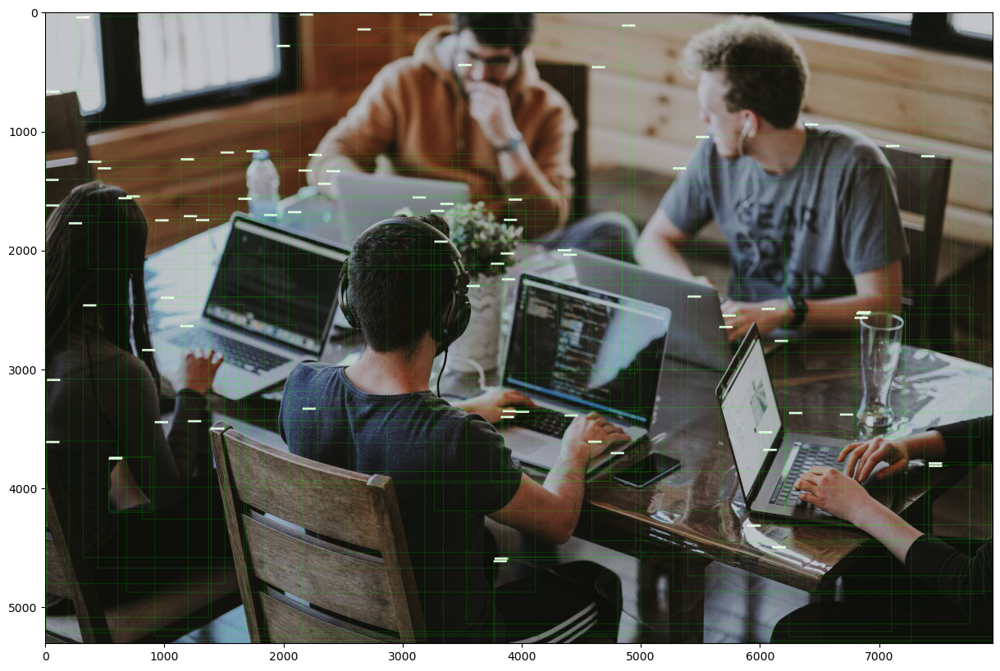

In [31]:
pred_thresh=get_predictions(pred,threshold=0.01)
draw_box(pred_thresh, img, rect_th= 1, text_size=0.5, text_th=1)

del pred_thresh

In [32]:
save_RAM(image_=True)

# Object Detection

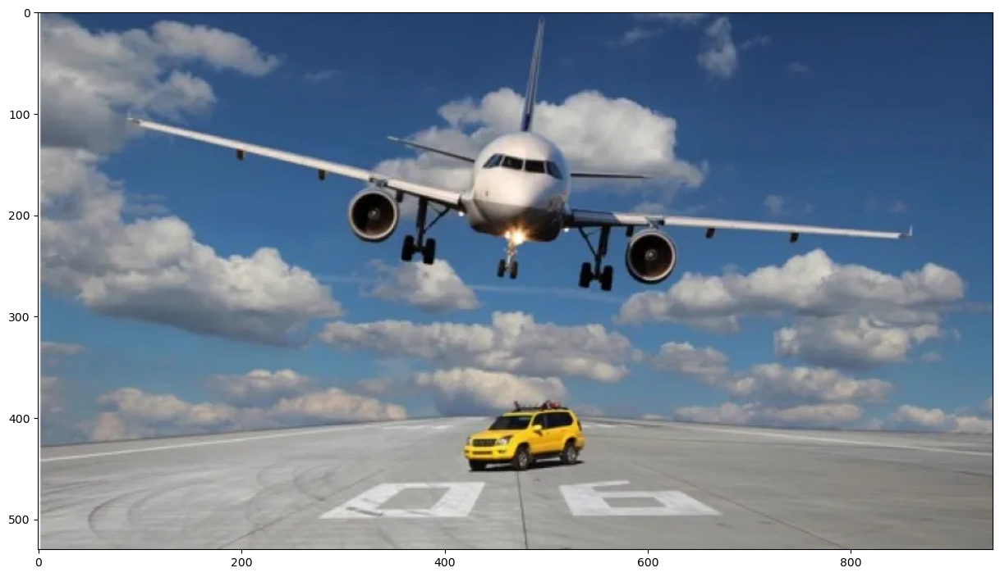

In [36]:
img_path='fly.jpg'
image = Image.open(img_path)
image.resize( [int(half * s) for s in image.size])
plt.figure(figsize=(15, 10))
plt.imshow(np.array(image))
plt.show()
del img_path


Label: airplane
Box coordinates: 92, 30, 867, 268
Probability: 0.9965265393257141

Label: car
Box coordinates: 417, 389, 538, 453
Probability: 0.9787903428077698


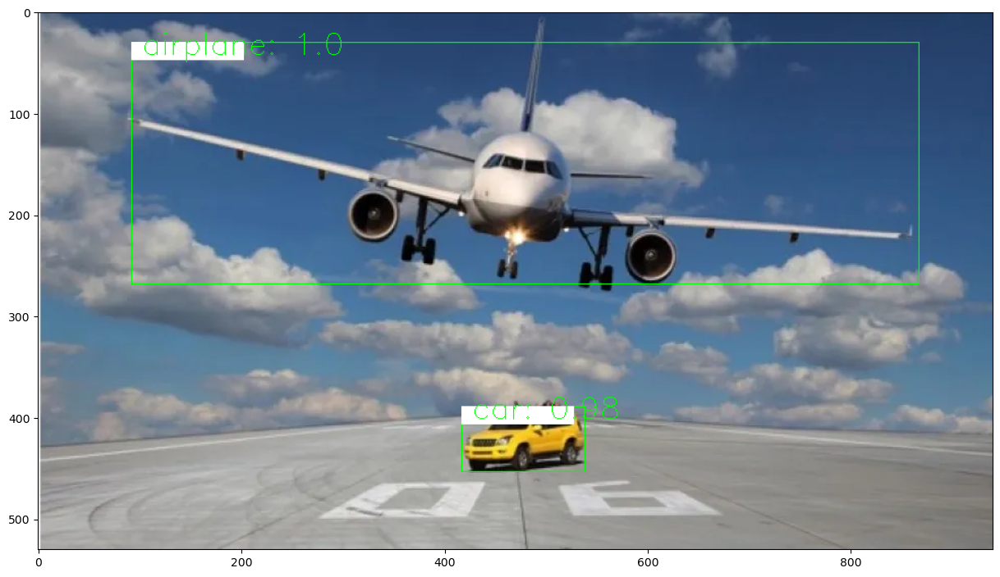

In [37]:
img = transform(image)
pred = model([img])
pred_thresh=get_predictions(pred,threshold=0.97)
draw_box(pred_thresh,img,rect_th=1, text_size=1, text_th=1, download_image=True, img_name="dog_cat_bird_BOX")

del pred_thresh

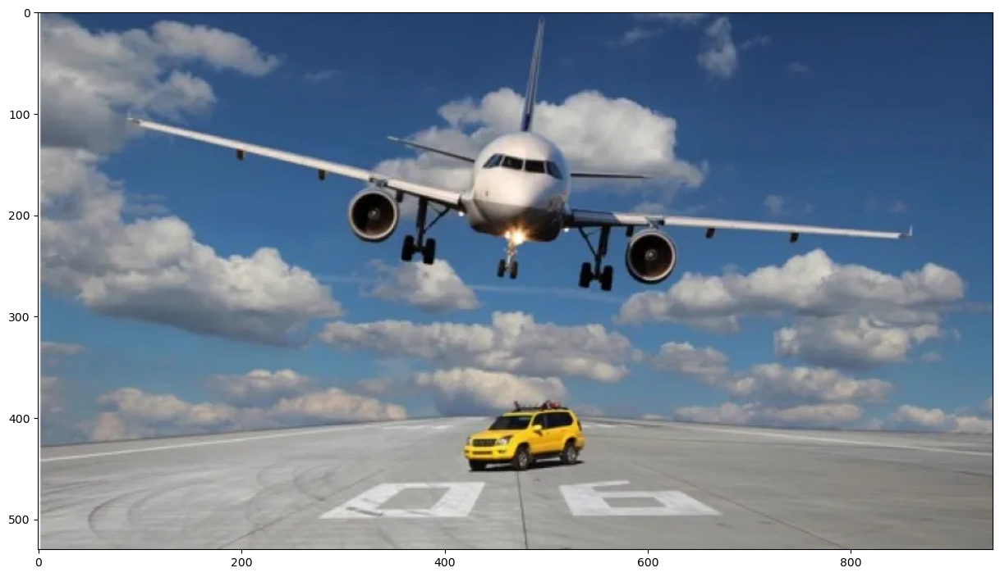

In [38]:
# img = transform(image)
# pred = model([img])
pred_obj=get_predictions(pred, objects=["dog","cat"])
draw_box(pred_obj, img,rect_th=1, text_size= 0.5, text_th=1)
del pred_obj

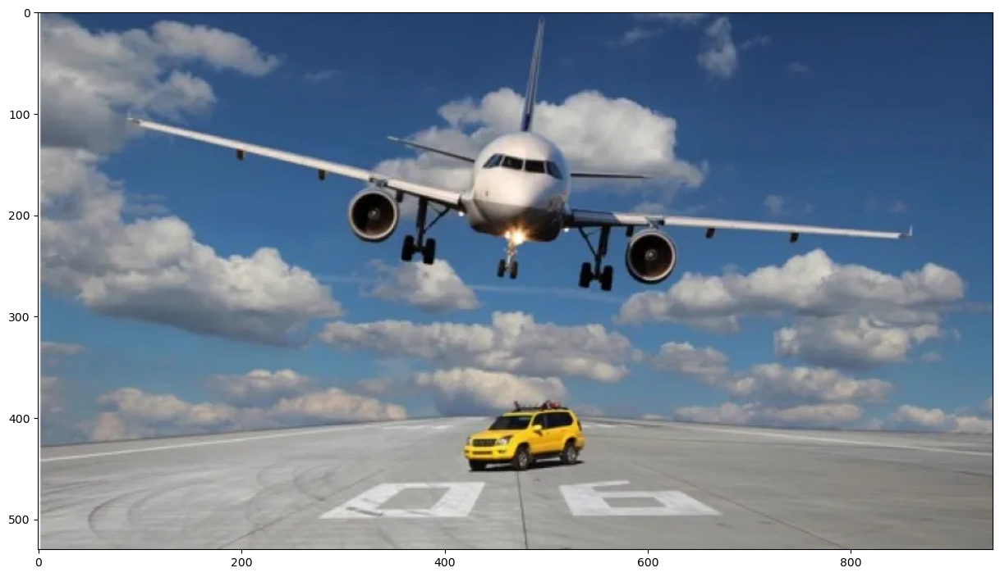

In [39]:
# img = transform(image)
# pred = model([img])
pred_thresh=get_predictions(pred, threshold=0.70, objects=["dog", "cat"])
draw_box(pred_thresh, img, rect_th= 1, text_size=1, text_th=1)

del pred_thresh

In [40]:
save_RAM(image_=True)

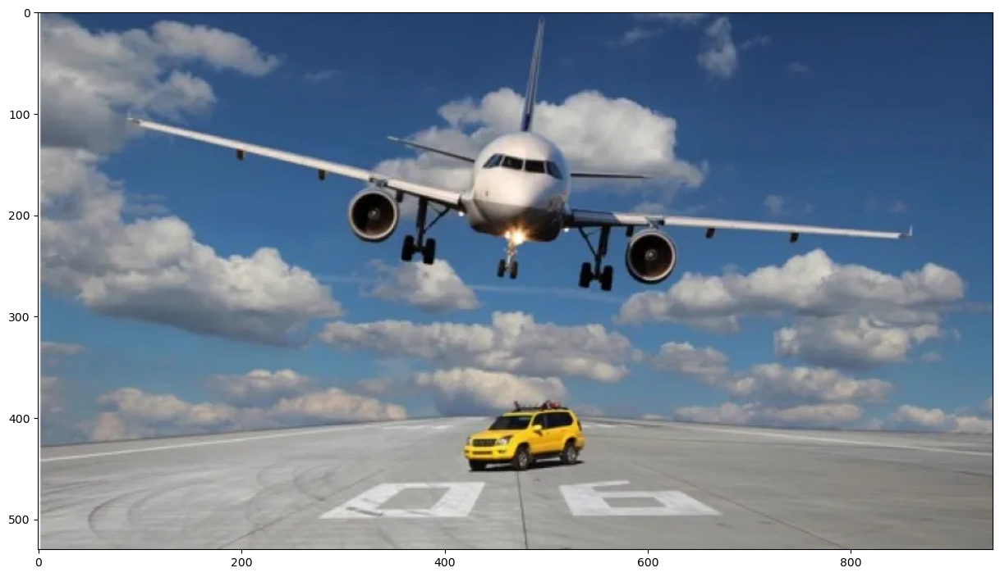

In [41]:
img_path='fly.jpg'
image = Image.open(img_path)
image.resize( [int(half * s) for s in image.size])
plt.figure(figsize=(15, 10))
plt.imshow(np.array(image))
plt.show()
del img_path

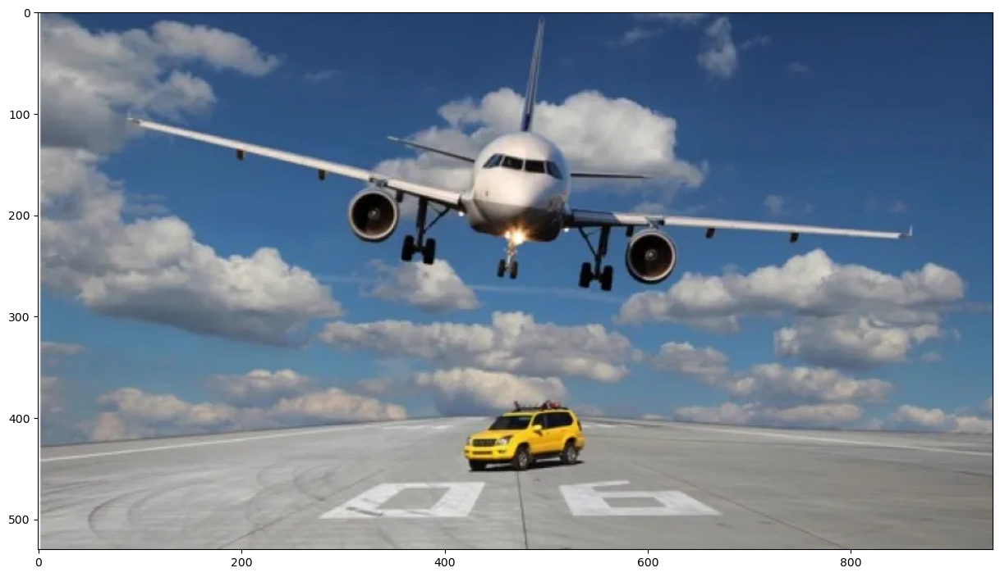

In [43]:
img = transform(image)
pred = model([img])
pred_thresh=get_predictions(pred, threshold=0.997)
draw_box(pred_thresh, img, download_image=True, img_name="fly")
del pred_thresh

In [44]:
save_RAM(image_=True)

# Test Model With an Uploaded Image

In [45]:
from pathlib import Path
print("Directory Path:", Path().absolute())

Directory Path: C:\Users\SIRISHA\ALML\AI SOLUTION


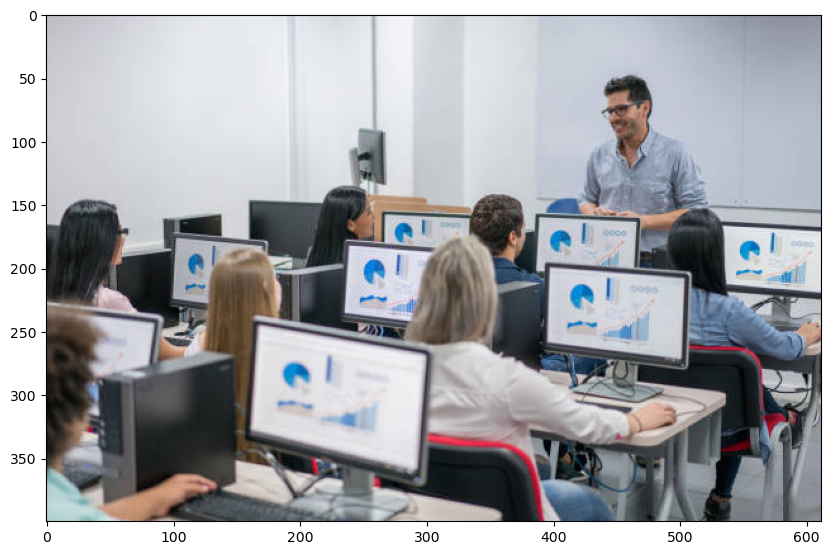

In [46]:
img_path = 'classroom.jpg'
image = Image.open(img_path)
plt.figure(figsize=(10, 15))
plt.imshow(np.array(image))
plt.show()


Label: person
Box coordinates: 417, 47, 524, 175
Probability: 0.985408365726471

Label: person
Box coordinates: 268, 169, 517, 391
Probability: 0.9808050394058228

Label: person
Box coordinates: 0, 237, 127, 399
Probability: 0.9780263304710388

Label: person
Box coordinates: 191, 136, 263, 246
Probability: 0.9767709970474243

Label: person
Box coordinates: 483, 157, 612, 296
Probability: 0.9690746665000916

Label: tv
Box coordinates: 390, 191, 511, 282
Probability: 0.9601832032203674

Label: person
Box coordinates: 108, 188, 187, 314
Probability: 0.9570263624191284


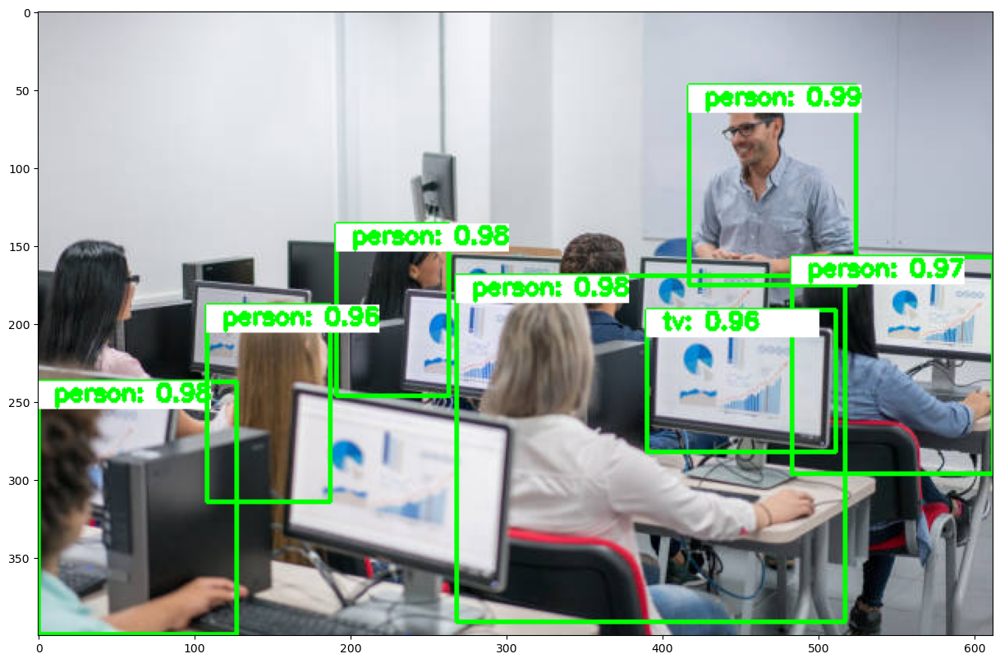

In [47]:
img = transform(image )
pred = model(img.unsqueeze(0))
pred_thresh=get_predictions(pred,threshold=0.95)
draw_box(pred_thresh, img, download_image=True, img_name="me_BOX")